# Deep Learning & Applied AI

We recommend to go through the notebook using Google Colaboratory.

# Tutorial 9: Geometric Deep Learning


In this tutorial, we will cover:

- Convolution operators on non-Euclidean domains


Our info:

- Luca Moschella (moschella@di.uniroma1.it)
- Antonio Norelli (norelli@di.uniroma1.it)

Course:

- Website and notebooks will be available at [DLAI-s2-2020](https://erodola.github.io/DLAI-s2-2020/)

##Import dependencies (run the following cells)

In [3]:
# @title import dependencies
from __future__ import print_function, division
!pip install python-igraph
import igraph
from typing import Mapping, Union, Optional
from pathlib import Path

import networkx as nx
import numpy as np
import argparse
import torch
import torch.nn as nn
from torch.nn import Module

import torch.nn.functional as F
import torch.optim as optim
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt
import torchvision
from torchvision import datasets, models, transforms

import os
import pickle
from tqdm.notebook import tqdm
from tqdm import trange




In [4]:
# @title reproducibility stuff

import random
np.random.seed(4)
random.seed(4)

torch.cuda.manual_seed(4)
torch.manual_seed(4)
torch.backends.cudnn.deterministic = True  # Note that this Deterministic mode can have a performance impact
torch.backends.cudnn.benchmark = False

# Introduction

## Information embedded in data

In machine learning we build models using the information contained in a collection of samples.

We can look at the information embedded in data as a combination of:
- The **signal**, encoding the features of the variables.
- The **structure**, encoding the relations between variables.

Formally we encode the features of these variables in a function $f$ over a domain $\Omega$ which defines the relations.

![alt text](https://raw.githubusercontent.com/lucmos/DLAI-s2-2020-tutorials/master/09/pics/data-signal-domain.PNG) 



Sometimes most of the information is in the signal.
> Consider the problem of predicting the hour of the day from pixels in the [Monet's paintings of the Rouen Cathedral](https://en.wikipedia.org/wiki/Rouen_Cathedral_(Monet_series)). Can you solve this problem without considering the structure?
>
>![alt text](https://raw.githubusercontent.com/lucmos/DLAI-s2-2020-tutorials/master/09/pics/picture.png)
>
> **EXERCISE**: Sketch a learning pipeline to solve this problem without considering the structure.

Sometimes most of the information is in the structure.
> Consider the problem of predicting people inscribed to a chess club in a social network. You know the true label of few people (inscribed/not inscribed), and some features for each person, say age and gender. Can you solve this problem without considering the structure?

>Another relevant example are proteins, which are essential elements for growth and repair, good functioning and structure of all living cells. Proteins are macromolecules composed by a chain of  smaller molecules (the amminoacids) which spontanuosly folds in a complex 3D arrangement. The functionality of proteins comes almost entirely from their shapes rather than the specific atoms of their composition. 

> **EXERCISE**: Which of the models we studied so far consider the structural information?

To learn proper models, we should be able to grasp all the relevant information in our data, whether in the signal or in the structure.

Notice that often the mutual information between the signal and the structure is non-zero, i.e. you may obtain some information about the signal observing only the structure and viceversa. Nevertheless it may be much easier to extract the information from one of the two.


> Consider newly proteins, suppose to have a dataset composed of 3d triangle meshes encoding their shapes and some categorical features encoded as functions defined on each vertex of the mesh, such as the amminoacid in that region of the protein and its positional encoding (the position of the amminoacid in the chain). 
>
>This kind of representation is redundant; the information about the shape of the protein is already contained in the chain of amminoacids, since this folds in a deterministic way. Your structure information is already encoded in the signal. In theory you can predict shape-dependent quantities, such as the degree of interaction between different proteins, using only the information in the signal; nevertheless extracting the shape information from the sequence of amminoacids is a very hard problem by itself (known as protein folding, one of the biggest open problems in biology) and in practice you obtain much better results using the shape information encoded in the triangle mesh. See for instance [*Deciphering interaction fingerprints from protein molecular surfaces using geometric deep learning (2019)*](https://www.nature.com/articles/s41592-019-0666-6).



## Digesting *a priori* the information in the structure 

We have already learned how to consider the structure information in a simple case; when the domain $\Omega$ is the Euclidean $\mathbb{R}^2$, i.e. when the relations between variables are represented by a 2-dimensional grid, such as the pixels of an image.

![immagine griglia 2d](https://raw.githubusercontent.com/lucmos/DLAI-s2-2020-tutorials/master/09/pics/euclidean.PNG) 

The filters of a convolutional neural network elaborate pixels considering only their neighbors and are applied with the same weights all over the image. In this way **CNNs are digesting *a priori* the structure information**, using the properties of the domain -- the translational invariance and the locality of neighbours -- to **reduce the free parameters of the model**. This leads to a crucial speed-up of the training process and allows larger and more powerful models. 

CNNs can be naturally extended to general Euclidean domains $\mathbb{R}^n$, but what can we do when $\Omega \neq \mathbb{R}^n$?

In many different fields such as Biology, Physics, Social Sciences and Computer Graphics we have to process signals defined on non-Euclidean domains, such as Graphs $\Omega = G(\mathcal{V, E})$ or [Manifolds](https://en.wikipedia.org/wiki/Manifold) $\Omega = \mathcal{X}$.

We would like to come out with a solution analoguous to CNNs; digesting *a priori* the structure information to reduce the free parameters proved to be very convenient in a learning setting based on a gradient descent optimization.

### Representing non-Euclidean data in an Euclidean memory

Working with non-Euclidean domains provides a further challenge in representing the data. 

In the Euclidean setting, encoding the data in ordered matrices, vectors or tensors is so natural and effective that we do not even think to alternatives, and indeed the computer memory structure is itself Euclidean.

In the non-Euclidean setting we have many alternatives, consider for instance a manifold $\mathcal{X}$. It can be represented by a triangle mesh with vertices, edges and faces $\mathcal{V,E,F}$, by a n-polygonal mesh, where we admit also non-triangle faces, by a simple point cloud or by a subdivision surface. 

And even when we have chosen the representation, we still have to come out with a last encoding procedure to store our data in matrices and tensors as required by the Euclidean structure of the physical memory in our computers. Is it always going to be this way? Maybe one day we will have new pieces of hardware structured as graphs, like human brains.






# Generalizing the convolution operation

In this section we will explore the Spectral convolution, a generalization of the convolution operation to non-Euclidean domains.



Given two functions $f, g: [-\pi, \pi] \rightarrow \mathbb{R}$ their convolution is defined as:

  $$
  (f\star g)(x) = \int_{-\pi}^\pi f(x') g(x-x') dx' 
  $$

Convolution is a linear operation, so in the discrete case can be written as a matrix multiplication.


The convolution of two vectors $\mathbf{f} = (f_1, \cdots, f_{n})^\top$ and $\mathbf{g} = (g_1, \cdots, g_{n})^\top$ is:


$$
\mathbf{f}\star \mathbf{g}
=
\mathbf{G} \mathbf{f} =
\begin{pmatrix}
g_{1} & g_2 & \cdots & \cdots & g_{n} \\
g_{n} & g_1 & g_2 & \cdots & g_{n-1} \\
\vdots & \vdots & \ddots & \ddots & \vdots \\
g_{3} & g_{4} &  \cdots &g_1 & g_2 \\
g_{2} & g_{3} &  \cdots &\cdots & g_1 \\
\end{pmatrix}
\begin{pmatrix}
f_1\\
\vdots\\
f_n\\
\end{pmatrix}
$$


Notice that this is a circulant matrix, i.e. each row vector is rotated one element to the right relative to the preceding row vector. 

If a linear operator admits an eigendecomposition, we can express it in the basis of its eigenvectors $V = \{v_1, \cdots, v_n\}$ through a diagonal matrix.

It turns out that all circulant matrices are diagonalized by the same basis $\Phi_\mathcal{E} = \{\phi_1, \cdots, \phi_n\}$:

$$
\mathbf{G}
=
\begin{pmatrix}
g_{1} & g_2 & \cdots & \cdots & g_{n} \\
g_{n} & g_1 & g_2 & \cdots & g_{n-1} \\
\vdots & \vdots & \ddots & \ddots & \vdots \\
g_{3} & g_{4} &  \cdots &g_1 & g_2 \\
g_{2} & g_{3} &  \cdots &\cdots & g_1 \\
\end{pmatrix}
=
\Phi_\mathcal{E}
\begin{pmatrix}
\hat{g_1} & &\\
& \ddots &\\
& & \hat{g_n}\\
\end{pmatrix}
\Phi^\top_\mathcal{E}
$$

This basis $\Phi_\mathcal{E}$ is very special, it is the discretized Fourier basis in the Euclidean domain:

$$
\Phi_\mathcal{E} = \{\phi_1, \cdots, \phi_n\}
\;\;\;\;\;\;
\text{with}
\;\;\;\;\;\;
\phi_k = 
\begin{pmatrix}
w_n^{0k} \\
w_n^{1k} \\
w_n^{2k} \\
\vdots \\
w_n^{(n-1)k}
\end{pmatrix}
\;\;\;\;\;\;
\text{and}
\;\;\;\;\;\;
w_n^{jk}=e^{\frac{2 \pi i}{n}jk}
$$

The expression of $\mathbf{G}$ as $\Phi_\mathcal{E} \mathbf{\hat{G}} \Phi^\top_\mathcal{E}$ will be our bridge towards non-Euclidean domains.

 

Infact we know a **generalization of the Fourier basis to graphs and manifolds**, the eigenvectors $\Phi$ of the Laplacian operator:

$$\Delta = \Phi \Lambda \Phi^\top$$ 

where $\Lambda$ is the diagonal matrix containing the eigenvalues of the Laplacian.

![fourier laplacian](https://raw.githubusercontent.com/lucmos/DLAI-s2-2020-tutorials/master/09/pics/fourier.png) 

The idea on these non-Euclidean domains is to calculate the eigenvectors of the Laplacian in the first place, which constitutes the generalized Fourier basis $\Phi$, and then **define the convolution operator** as:

$$
\mathbf{W}
=
\Phi
\begin{pmatrix}
\hat{w_1} & &\\
& \ddots &\\
& & \hat{w_n}\\
\end{pmatrix}
\Phi^\top
$$

Where $\hat{w_i}$ are learnable parameters.

Notice that in the Euclidean case this expression coincides with the standard convolution defined above, since the eigenvectors of the Laplacian in that case *are* the Euclidean Fourer basis. This is a desired property.

However we have several drawbacks:
- The filters coefficients $\hat{w_i}$ depend on the basis $\Phi$. Learned filters do not generalize across domains; the addition of a single node in a graph or the small differences in a mesh after a change of pose fatally changes the basis. For instance a convolutional filter with parameters $\hat{w_i}$ tuned to spot edges changes completely behaviour on a slightly different domain.

![conv_broken](https://raw.githubusercontent.com/lucmos/DLAI-s2-2020-tutorials/master/09/pics/broken_filter.png) 
- The number of trainable parameters per filter depends on $n$, the size of the domain. We want a convolutional filter with a fixed number of parameters like in the Euclidean case.
- Since the trainable parameters $\hat{y_i}$ are not properly constrained, there is a high chance that the learned filter is not localized in space, as seen in the lecture slides.

To address these problems we put some constraints on the matrix $\mathbf{\hat{W}}$, parametrizing it in a different way.

Instead of having a degree of liberty per element of the diagonal ($n$ learnable parameters), we substitute $\mathbf{\hat{W}}$ with the fixed eigenvalues of the Laplacian $\Lambda$ altered by a single parametrized transformation $\tau_\alpha(\lambda)$, which depends on a fixed number of learnable parameters $\alpha$. 
Our new $\mathbf{W}$ will be:

$$
\mathbf{W}
=
\Phi
\begin{pmatrix}
\tau_\alpha(\lambda_1) & &\\
& \ddots &\\
& & \tau_\alpha(\lambda_n)\\
\end{pmatrix}
\Phi^\top
$$

In the second part of this tutorial we will explore an application of this generalized convolution operation on graphs. We will define the Laplacian operator on graphs, then we will compute its eigendecomposition and define a proper transformation $\tau_\alpha$.

# Applications

We will see two applications:

- A in-depth example of graph convolutions on the Karate dataset.
- An example of graph convolutions on the CORA dataset 


## GCN & Karate

In this section we will see the GCN defined in [Semi-Supervised Classification with Graph Convolutional Networks](https://arxiv.org/abs/1609.02907), applied to the [Karate dataset](http://networkrepository.com/soc-karate.php)

---
 
Code and explanations adapted from this [tutorial](https://nbviewer.jupyter.org/github/vistalab-technion/cs236781-tutorials/blob/master/t09/tutorial9-GeometricDL.ipynb).

### The Karate dataset

The Karate dataset is a very small graph with only 34 nodes, the task we will tackle is node classification.

This small dataset will allow us to visualize the graph and the behaviour of the graph convolution.

From [Wikipedia](https://en.wikipedia.org/wiki/Zachary%27s_karate_club),

> A social network of a karate club was studied by Wayne W. Zachary for a period of three years from 1970 to 1972.
> The network captures 34 members of a karate club, documenting links between pairs of members who **interacted outside the club**.
> During the study a conflict arose between the **administrator** "John A" and **instructor** "Mr. Hi" (pseudonyms), which led to the split of the club into two.
> 
> Half of the members formed a new club around Mr. Hi; members from the other part found a new instructor or gave up karate. Based on collected data Zachary correctly assigned all but one member of the club to the groups they actually joined after the split. 
> 

That is,

- Each node is a member of the club
- A link means that two members have interacted outside the club
- Every node has an attribute `club` that indicates which of the two communities he joined after the split.

Our goal is to detected which of the two splitted community will join each member of the club. 

**We will use the labels of only two nodes**, and infer the labels of all the other nodes from the graph structure.

In [5]:
# The karate dataset is built-in in networkx
import networkx as nx

G = nx.karate_club_graph()

# Known ids of the instructor, admin and members
ID_INSTR = 0    
ID_ADMIN = 33
ID_MEMBERS = set(G.nodes()) - {ID_ADMIN, ID_INSTR}

print(f'{G.name}: {len(G.nodes)} vertices, {len(G.edges)} edges')

Zachary's Karate Club: 34 vertices, 78 edges


C:\Users\andre\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:611: MatplotlibDeprecationWarning:

isinstance(..., numbers.Number)



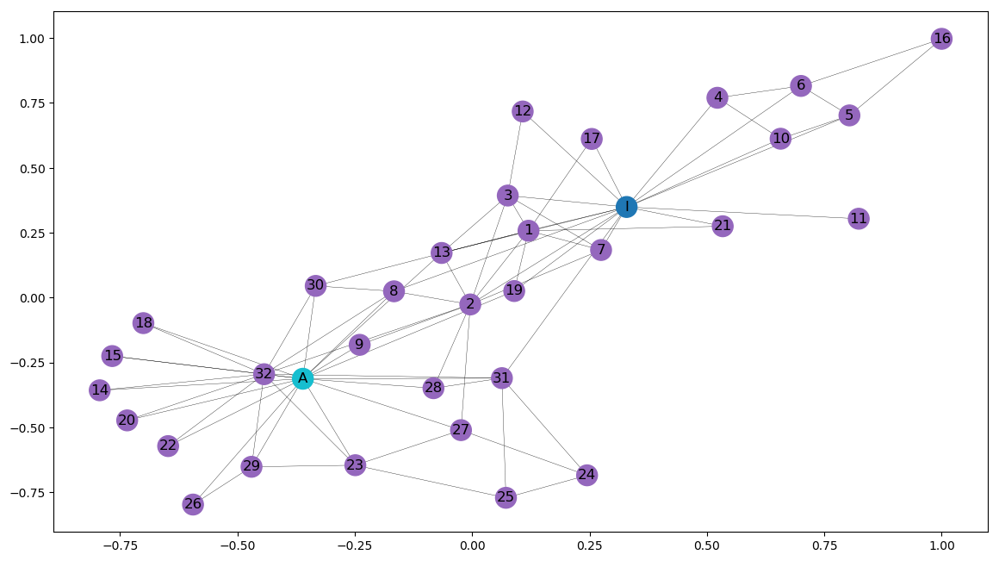

In [6]:
#@title visualization
# Visualize the Karate Club graph using network x
fig, ax = plt.subplots(1,1, figsize=(14,8), dpi=100)
pos = nx.spring_layout(G, iterations=500)
cmap = cmap=plt.cm.tab10
node_colors = [0.4] * G.number_of_nodes()
node_colors[ID_INSTR] = 0.
node_colors[ID_ADMIN] = 1.
node_labels = {i: i for i in ID_MEMBERS}
node_labels.update({i: l for i,l in zip([ID_ADMIN, ID_INSTR],['A','I'])})
nx.draw_networkx(G, 
                 pos, 
                 node_color=node_colors, 
                 width=.25,
                 labels=node_labels, 
                 ax=ax, 
                 cmap=cmap);

Looking at the graph, it looks like there are two communities around the instructor and the administrator. 

It is intuitive to assume the members close to the instructor will join the community of the instructor when the club will split, and the same with the administrator. Even though, for some nodes it is not obvious even for us to predict which cummunity they will join.

The graph neural networks are able to *learn* the *structure* of the graph, and make predictions according to it.

### Data preprocessing

Thus, to recap, we're going to use only two labels and perform the prediction on the other nodes looking only at the graph structure.

Each vertex has a `club` attribute to represent the post-split community he joined, we will train using the `club` labels for the Instructor and the Administrator only.

For the other nodes we will just use a one-hot encoding, that are *not informative* on which community that node will join. Thus the model will have to learn everything from the structure.

In [7]:
# Input featuers (no information on nodes):
X = torch.eye(G.number_of_nodes())

# Create ground-truth labels
# - Assign the label "0" to the "Mr. Hi" community
# - Assign the label "1" to the "Officer" community
labels = [int(not d['club']=='Mr. Hi') for _, d in G.nodes().data()]
labels = torch.tensor(labels, dtype=torch.long)

# Let's check the nodes metadata
for (node_id, node_data), label_id in zip(G.nodes().data(), labels):
    print(f'Node id: {node_id},\tClub: {node_data["club"]},\t\tLabel: {label_id.item()}')

Node id: 0,	Club: Mr. Hi,		Label: 0
Node id: 1,	Club: Mr. Hi,		Label: 0
Node id: 2,	Club: Mr. Hi,		Label: 0
Node id: 3,	Club: Mr. Hi,		Label: 0
Node id: 4,	Club: Mr. Hi,		Label: 0
Node id: 5,	Club: Mr. Hi,		Label: 0
Node id: 6,	Club: Mr. Hi,		Label: 0
Node id: 7,	Club: Mr. Hi,		Label: 0
Node id: 8,	Club: Mr. Hi,		Label: 0
Node id: 9,	Club: Officer,		Label: 1
Node id: 10,	Club: Mr. Hi,		Label: 0
Node id: 11,	Club: Mr. Hi,		Label: 0
Node id: 12,	Club: Mr. Hi,		Label: 0
Node id: 13,	Club: Mr. Hi,		Label: 0
Node id: 14,	Club: Officer,		Label: 1
Node id: 15,	Club: Officer,		Label: 1
Node id: 16,	Club: Mr. Hi,		Label: 0
Node id: 17,	Club: Mr. Hi,		Label: 0
Node id: 18,	Club: Officer,		Label: 1
Node id: 19,	Club: Mr. Hi,		Label: 0
Node id: 20,	Club: Officer,		Label: 1
Node id: 21,	Club: Mr. Hi,		Label: 0
Node id: 22,	Club: Officer,		Label: 1
Node id: 23,	Club: Officer,		Label: 1
Node id: 24,	Club: Officer,		Label: 1
Node id: 25,	Club: Officer,		Label: 1
Node id: 26,	Club: Officer,		Label: 1
N

### Adjacency matrices as operators

We can see *node-to-node* adjacency matrices as *operators* when applied to functions over the vertices of a graph.

For example, $\mathbf{g} = \mathbf{Af}$ yields a new *node-based* function $g$ defined as:

$$
g(v_i) = \sum_{e_{ij} \in E} f(v_j)
$$

On this observation, one can construct new adjacency-based operators such as $\mathbf{I-A}$:

$$
g(v_i) = f(v_i) - \sum_{e_{ij} \in E} f(v_j)
$$

Or such as... the Laplacian operator

### **EXERCISE**
>
> What does the $k$-power of the adjacency matrix $A$ represent? 
> i.e. what does the element $(A^k)_{ij}$ represent? 
>
> Did you study any algorithm that is able to do a similar thing?

### Graph Laplacian

#### Laplacian computation

The Graph Laplacian is defined as follows:

$$
L_{ij} =
\begin{cases}
 D_{ii} & \text{if } i = j \\
 -1 & \text{if } i \neq j \text{ and } e_{ij} \in E \\
 0 & \text{otherwise}
\end{cases}
$$

where $D$ is the diagonal matrix that contains the degree of the vertices $v_i$ along the diagonal.

Thus, the laplacian can be written in matrix notation as:

$$
L = D - A
$$

The Laplacian can be seen as a vertex-based operator, it is a function $f: V \to \mathcal{R}$

In [8]:
# Adjacency matrix, binary
A = nx.adj_matrix(G, weight=None)
A = np.array(A.todense())
A

array([[0, 1, 1, ..., 1, 0, 0],
       [1, 0, 1, ..., 0, 0, 0],
       [1, 1, 0, ..., 0, 1, 0],
       ...,
       [1, 0, 0, ..., 0, 1, 1],
       [0, 0, 1, ..., 1, 0, 1],
       [0, 0, 0, ..., 1, 1, 0]], dtype=int32)

In [9]:
# Degree matrix
dii = np.sum(A, axis=1, keepdims=False)  # sum the columns of the adj
D = np.diag(dii)
D

array([[16,  0,  0, ...,  0,  0,  0],
       [ 0,  9,  0, ...,  0,  0,  0],
       [ 0,  0, 10, ...,  0,  0,  0],
       ...,
       [ 0,  0,  0, ...,  6,  0,  0],
       [ 0,  0,  0, ...,  0, 12,  0],
       [ 0,  0,  0, ...,  0,  0, 17]], dtype=int32)

In [10]:
# Laplacian
L = D - A
L

array([[16, -1, -1, ..., -1,  0,  0],
       [-1,  9, -1, ...,  0,  0,  0],
       [-1, -1, 10, ...,  0, -1,  0],
       ...,
       [-1,  0,  0, ...,  6, -1, -1],
       [ 0,  0, -1, ..., -1, 12, -1],
       [ 0,  0,  0, ..., -1, -1, 17]], dtype=int32)

#### The Laplacian matrix has some interesting properties

The Laplacian $L$ of an undirected graph has many interesting properties, some of them are:

- It is symmetric and has the same zero pattern of the adjacency matrix
- It is [positive-semidefinite](https://en.wikipedia.org/wiki/Definiteness_of_a_matrix)
- Every row sum and column sum of $L$ is zero.
- The trace of the Laplacian Matrix $L$ is equal to $2m$ where $m$ is the number of edges of the considered graph. (This is straighforward to prove: the sum of the degrees of the vertices is twice the number of the edges. Why? Each edge connects exactly two vertices. Thus, it is counted twice in the sum of degrees, once for each vertex it connects.)
- For a graph with multiple connected components, $L$ is a block diagonal matrix (possibly after reordering the vertices), where each block is the Laplacian matrix of each component.

In [11]:
# Symmetric
(L.transpose() == L).all()


True

In [12]:
# Sum of degrees
np.trace(L) == 2 * G.number_of_edges()

True

In [13]:
# Sum of colums/rows is zero
print(np.sum(L, axis=1))
print(np.sum(L, axis=0))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


#### The Laplacian spectrum

As you already saw, the eigenfunctions of the Laplacian operator are a generalization of the Fourier basis, which we can use as a basis to represent functions over our domain.

Even the spectrum, i.e. the eigenvalues of the Laplacian, have many interesting properties. Some of them are:

- The first eigenvalue is always zero
- The number of connected components in the graph is the multiplicity of the zero eigenvalue






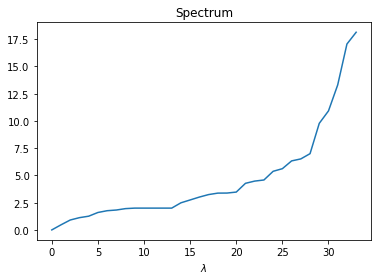

In [14]:
# Compute the eigevanlues and eigenvector
w, Phi = np.linalg.eigh(L)

plt.plot(w); plt.xlabel(r'$\lambda$'); plt.title('Spectrum');

#### Laplacian basis

Let's visualize the Laplacian basis of the Karate graph, we expect an oscillatory behaviour similar to the Fourier basis on signals. 

It will be a bit difficult to see, since there are few nodes.

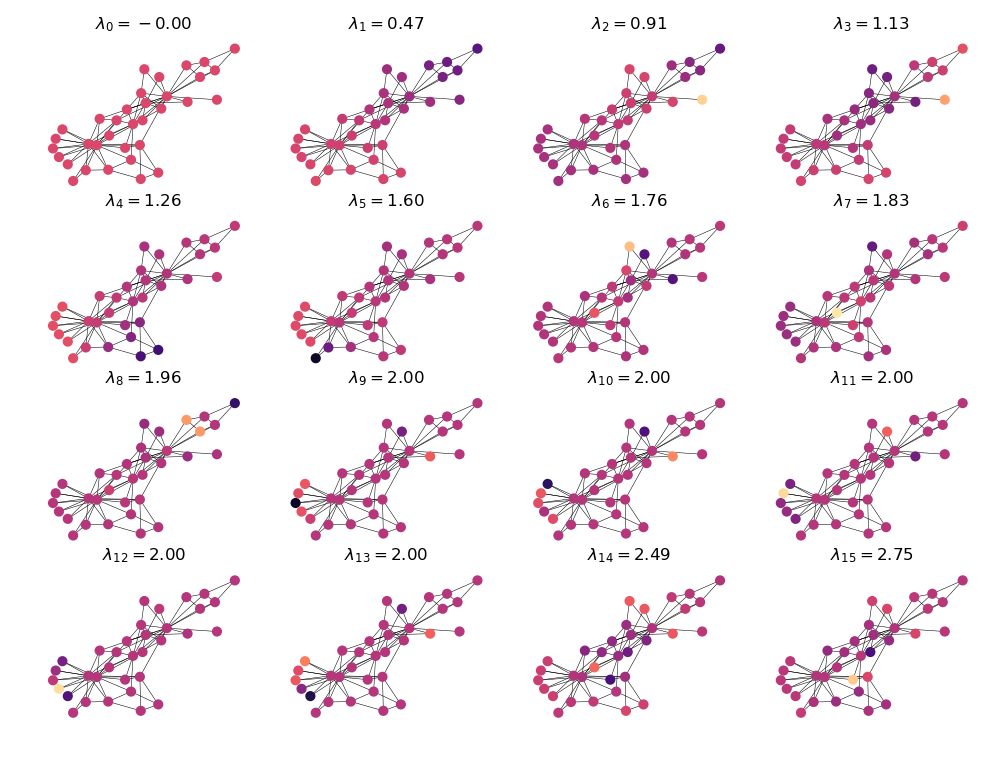

In [15]:
#@title visualization 

# Plot Fourier basis
fig, ax = plt.subplots(4, 4, figsize=(8,6), dpi=150)
ax = ax.reshape(-1)
vmin, vmax = np.min(Phi), np.max(Phi)
for i in range(len(ax)):
    nc = Phi[:,i]
    nx.draw_networkx(G, pos, node_color=nc, with_labels=False, node_size=15, ax=ax[i], width=0.25, cmap=plt.cm.magma, vmin=vmin, vmax=vmax, widht=.25)
    ax[i].axis('off')
    ax[i].set_title(rf'$\lambda_{{{i}}}={w[i]:.2f}$',fontdict=dict(fontsize=8))

#### Normalized graph Laplacian

Following the paper, we will use a normalized flavour of the Laplacian, defined as follows:

$$
\mathbf{\Delta} = \mathbf{D}^{-1/2}\tilde{\mathbf{A}}\mathbf{D}^{-1/2}.
$$

Where:
- $\tilde{\mathbf{A}}=\mathbf{A}+\mathbf{I}$
- $\mathbf{A}$ is the adjacency matrix 
- $\mathbf{D}$ is the degree matrix.

Intuitivelly: $\Delta$ is the adjacency matrix with enforced self-loops, normalized by the geometric mean of the degrees of the two nodes:
$$
\Delta_{ij} = \frac{\tilde{A}_{ij}}{\sqrt{D_{ii} D_{jj}}}.
$$

The self-loops allow the output features of a node to also depend on its input features, not just on its neighbors. Without the self-loop each node would consider its neighbours' features, but not its own!

In [16]:
# Adjacency matrix
A = nx.adj_matrix(G, weight=None)
A = np.array(A.todense())
I = np.eye(A.shape[0])
A = A + I

# Degree matrix (only the diagonal)
dii = np.sum(A, axis=1, keepdims=False)
#D = np.diag(dii)

# Normalized Laplacian
D_inv_h = np.diag(dii**(-0.5))
L =  D_inv_h @ A @ D_inv_h

### Model

In this paper they choose to use $\tau_\alpha(\lambda_i) = \sum_{k=1}^{q}\alpha_k\lambda_i^k \;$, thus the convolutional filter $\mathbf{W}$ becomes:

$$
\begin{align}
\mathbf{W} = \mathbf{\Phi}\mathbf{\hat W}\mathbf{\Phi}^\top
&= 
\mathbf{\Phi}
\begin{pmatrix}
\sum_{k=1}^{q}\alpha_k\lambda_1^k &  &  \\
 & \ddots &  \\
 &  & \sum_{k=1}^{q}\alpha_k\lambda_n^k \\
\end{pmatrix}
\mathbf{\Phi}^\top
=
\sum_{k=1}^{q}\alpha_k
\mathbf{\Phi}
\begin{pmatrix}
\lambda_1^k &  &  \\
 & \ddots &  \\
 &  & \lambda_n^k \\
\end{pmatrix}
\mathbf{\Phi}^\top \\
&=  \sum_{k=1}^{q}\alpha_k \mathbf{\Phi} \mathbf{\Lambda}^k \mathbf{\Phi}^\top
= \sum_{k=1}^{q}\alpha_k \mathbf{\Delta}^k.
\end{align} 
$$

With this choice of $\tau_\alpha$ it is not necessary to compute the eigendecomposition of the Laplacian $\mathbf{\Phi}\mathbf{\Lambda}\mathbf{\Phi}^\top$, we can use directly the $k$-powers of $\mathbf{\Delta}$.

Our model will have two GCN layers.
Each layer takes a tensor containing $C_\text{in}$ features for each node,
and returns a tensor containing $C_\text{out}$ features.

In [17]:
import torch.nn as nn
from typing import List

class GCNLayer(nn.Module):
    def __init__(self, 
                 graph_L: torch.Tensor, 
                 in_features: int, 
                 out_features: int, 
                 max_deg: int = 1
        ):
        """
        :param graph_L: the normalized graph laplacian. It is all the information we need to know about the graph
        :param in_features: the number of input features for each node
        :param out_features: the number of output features for each node
        :param max_deg: how many power of the laplacian to consider, i.e. the q in the spacial formula
        """
        super().__init__()
        
        # Each FC is like the alpha_k matrix, with the last one including bias
        self.fc_layers = nn.ModuleList()
        for i in range(max_deg - 1):
            self.fc_layers.append(nn.Linear(in_features, out_features, bias=False))     # q - 1 layers without bias
        self.fc_layers.append(nn.Linear(in_features, out_features, bias=True))          # last one with bias
        
        # Pre-calculate beta_k(L) for every key
        self.laplacians = self.calc_laplacian_functions(graph_L, max_deg)
        
    def calc_laplacian_functions(self, 
                                 L: torch.Tensor, 
                                 max_deg: int
        ) -> List[torch.Tensor]:
        """
        Compute all the powers of L from 1 to max_deg

        :param L: a square matrix
        :param max_deg: number of powers to compute

        :returns: a list of tensors, where the element i is L^{i+1} (i.e. start counting from 1)
        """
        res = [L]
        for _ in range(max_deg-1):
            res.append(torch.mm(res[-1], L))
        return res
        
    def forward(self, X: torch.Tensor) -> torch.Tensor:
        """
        Perform one forward step of graph convolution

        :params X: input features maps [vertices, in_features]
        :returns: output features maps [vertices, out_features]
        """
        Z = torch.tensor(0.)
        for k, fc in enumerate(self.fc_layers):
            L = self.laplacians[k]
            LX = torch.mm(L, X)
            Z = fc(LX) + Z
        
        return torch.relu(Z)

### EXERCISE: **bug in sight!**
> If you try to serialize (e.g. save on disk) a trained instance of the previous model with `torch.save`, and then load it again with `torch.load`... it will not work. 
>
> Can you see why? How would you solve this problem?



In [0]:
#@title Solution 👀

# The laplacians are not saved!
# Check out the Buffers in pytorch to save them:
# https://pytorch.org/docs/stable/nn.html?highlight=register_buffer#torch.nn.Module.register_buffer

In [18]:
in_features, out_features = X.shape[1], 2
graph_L = torch.tensor(L, dtype=torch.float)
max_deg = 2
hidden_dim = 5

# Stack two GCN layers as our model
gcn2 = nn.Sequential(
    GCNLayer(graph_L, in_features, hidden_dim, max_deg),
    GCNLayer(graph_L, hidden_dim, out_features, max_deg),
    nn.LogSoftmax(dim=1)
)
gcn2

Sequential(
  (0): GCNLayer(
    (fc_layers): ModuleList(
      (0): Linear(in_features=34, out_features=5, bias=False)
      (1): Linear(in_features=34, out_features=5, bias=True)
    )
  )
  (1): GCNLayer(
    (fc_layers): ModuleList(
      (0): Linear(in_features=5, out_features=2, bias=False)
      (1): Linear(in_features=5, out_features=2, bias=True)
    )
  )
  (2): LogSoftmax()
)

### Training

We'll train as a simple classification task, with the only nuance that only the Instructor and Administrator labels are used.

In [19]:
import torch.nn.functional as F
import torch.optim

def train_node_classifier(model, optimizer, X, y, epochs=60, print_every=10):
    y_pred_epochs = []
    for epoch in range(epochs+1):
        y_pred = model(X)  # Compute on all the graph
        y_pred_epochs.append(y_pred.detach())

        # Semi-supervised: only use labels of the Instructor and Admin nodes
        labelled_idx = [ID_ADMIN, ID_INSTR]
        loss = F.nll_loss(y_pred[labelled_idx], y[labelled_idx])  # loss on only two nodes

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if epoch % print_every == 0:
            print(f'Epoch {epoch:2d}, loss={loss.item():.5f}')
    return y_pred_epochs

In [20]:
optimizer = torch.optim.Adam(gcn2.parameters(), lr=0.01)

y_pred_epochs = train_node_classifier(gcn2, optimizer, X, labels)

Epoch  0, loss=0.69290
Epoch 10, loss=0.56610
Epoch 20, loss=0.42837
Epoch 30, loss=0.28857
Epoch 40, loss=0.17522
Epoch 50, loss=0.09709
Epoch 60, loss=0.05082


Since our loss is calculated based on two samples only, it's not a good criterion of overall classification accuracy.

Let's look at the the accuracy over all nodes:

In [21]:
from sklearn.metrics import classification_report

y_pred = torch.argmax(gcn2(X), dim=1).detach().numpy()
y = labels.numpy()
print(classification_report(y, y_pred, target_names=['I','A']))

              precision    recall  f1-score   support

           I       1.00      0.88      0.94        17
           A       0.89      1.00      0.94        17

   micro avg       0.94      0.94      0.94        34
   macro avg       0.95      0.94      0.94        34
weighted avg       0.95      0.94      0.94        34



### Compare with MLP

Lets see what we get when we use a regular MLP on the same task.

Remember, we're only training using 2/34 labeled samples.

In [22]:
mlp = nn.Sequential(
    nn.Linear(in_features, hidden_dim),
    nn.ReLU(),
    nn.Linear(hidden_dim, out_features),
    nn.ReLU(),
    nn.LogSoftmax(dim=1)
)

optimizer = torch.optim.Adam(mlp.parameters(), lr=0.01)
_ = train_node_classifier(mlp, optimizer, X, labels, epochs=2000, print_every=500)

print(classification_report(labels.numpy(), torch.argmax(mlp(X), dim=1).detach().numpy(), target_names=['I','A']))

Epoch  0, loss=0.69642
Epoch 500, loss=0.34689
Epoch 1000, loss=0.34668
Epoch 1500, loss=0.34661
Epoch 2000, loss=0.34659
              precision    recall  f1-score   support

           I       0.52      1.00      0.68        17
           A       1.00      0.06      0.11        17

   micro avg       0.53      0.53      0.53        34
   macro avg       0.76      0.53      0.40        34
weighted avg       0.76      0.53      0.40        34



As expected the MLP can't learn much about the nodes that we didn't train on.

Why was the GCN able to do this?

Recall that due to the multiplication with the Laplacian, the node embeddings calculated by the GCN at each layer combine the previous layer features from neighboring nodes.

When we back-propped from our two labeled nodes, we also updated the model parameters to produce more meaningful embedding for their neighbors!

### Visualization

In [23]:
# @title visualitazion

import matplotlib.animation as animation
from IPython.display import HTML
import math
def animate_classification(G, y_pred_epochs):
    fig, ax = plt.subplots(figsize=(8, 6), dpi=150)
    
    def draw(epoch_idx):
        pos = {}
        colors, sizes = [],[]
        for v in range(G.number_of_nodes()):
            pos[v] = y_pred_epochs[epoch_idx][v].numpy()
            y_pred_v = np.argmax(pos[v])
            y_v = labels[v]
            if y_pred_v == y_v: colors.append(y_v)
            else: colors.append(0.4) # wrong prediction
            sizes.append((math.exp(pos[v][y_v]))*300) # size is proba of correct label
        ax.cla()
        ax.set_title(f'Epoch {epoch_idx}')
        ax.set_xlabel('Log Softmax Score 1')
        ax.set_ylabel('Log Softmax Score 2')
        nx.draw_networkx(G, 
                         pos, 
                         node_color=colors, 
                         labels=node_labels, 
                         ax=ax, 
                         cmap=cmap, 
                         node_size=sizes, 
                         width=0.1)

    anim = animation.FuncAnimation(fig, draw, frames=len(y_pred_epochs), interval=150)
    html = HTML(anim.to_html5_video())
    plt.close()
    return html

RuntimeError: Requested MovieWriter (ffmpeg) not available

C:\Users\andre\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:611: MatplotlibDeprecationWarning:

isinstance(..., numbers.Number)



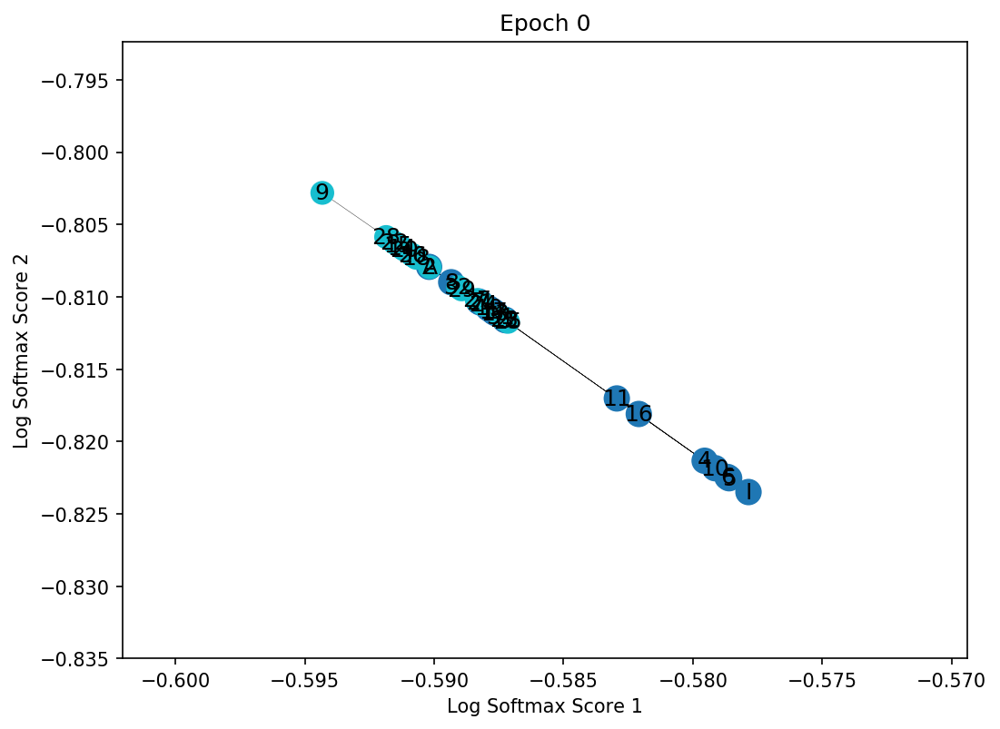

In [24]:
# The coordinates are the log_softmax scores
animate_classification(G, y_pred_epochs)

## GCN & CORA

The code in the following sections comes mainly from [this repository](https://github.com/tkipf/pygcn) and it is inspired by the paper [Semi-Supervised Classification with Graph Convolutional Networks](https://arxiv.org/abs/1609.02907), where Thomas Kipf presents the Graph Convolutional Networks in PyTorch.


### The CORA dataset

The CORA dataset is a much bigger dataset when compared to the Karate graph, the task is again node classification.

In the CORA graph where:
- Each **node** is a Machine Learning paper. 
- An **edge** represents one citation from one paper to another.
- Each node is classified into one of seven possible Machine Learning sub-fields:
 - Case Based
 - Genetic Algorithms
 - Neural Networks
 - Probabilistic Methods
 - Reinforcement Learning
 - Rule Learning
 - Theory

We will use a subset of the CORA dataset, preprocessed as suggested by [Thomas Kipf](https://github.com/tkipf/pygcn/tree/master/data/cora):

- It considers only papers that are cited or cite at least once.
- The words are [stemmed](https://en.wikipedia.org/wiki/Stemming)
- Stopwords and infrequent words are removed.

This subset contains **2708** paper with **1433** unique words.


--- 

[Here](http://networkrepository.com/cora.php) you can have fun exploring the complete CORA dataset, and many other graph datasets.

In [0]:
classes = [
    'Case_Based',
    'Genetic_Algorithms',
    'Neural_Networks',
    'Probabilistic_Methods',
    'Reinforcement_Learning',
    'Rule_Learning',
    'Theory',
]

### Dataset format

In [0]:
# The preprocessed CORA is contained in this repository under ./data/cora
!git clone https://github.com/tkipf/pygcn.git

Cloning into 'pygcn'...
remote: Enumerating objects: 78, done.
remote: Total 78 (delta 0), reused 0 (delta 0), pack-reused 78
Unpacking objects: 100% (78/78), done.


The directory `pygnc/data/cora` contains two files: `cora.content` and `cora.cites`.

The `cora.content` contains the description of each node. For each line it contains:
 - The id of the node.
 - The [bag-of-words](https://en.wikipedia.org/wiki/Bag-of-words_model) text representation.
 - The label of that node.

In [0]:
import pandas
headers = ['PaperID'] + [f'word{i}' for i in range(1433)] + ['label']
pandas.read_csv('pygcn/data/cora/cora.content', sep="\t", names=headers)

,PaperID,word0,word1,word2,word3,word4,word5,word6,word7,word8,word9,word10,word11,word12,word13,word14,word15,word16,word17,word18,word19,word20,word21,word22,word23,word24,word25,word26,word27,word28,word29,word30,word31,word32,word33,word34,word35,word36,word37,word38,...,word1394,word1395,word1396,word1397,word1398,word1399,word1400,word1401,word1402,word1403,word1404,word1405,word1406,word1407,word1408,word1409,word1410,word1411,word1412,word1413,word1414,word1415,word1416,word1417,word1418,word1419,word1420,word1421,word1422,word1423,word1424,word1425,word1426,word1427,word1428,word1429,word1430,word1431,word1432,label
0,31336,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,Neural_Networks
1,1061127,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,Rule_Learning
2,1106406,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,Reinforcement_Learning
3,13195,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Reinforcement_Learning
4,37879,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Probabilistic_Methods
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2703,1128975,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Genetic_Algorithms
2704,1128977,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Genetic_Algorithms
2705,1128978,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Genetic_Algorithms
2706,117328,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Case_Based


The `cora.cites` contains the relationships between nodes. For each line it contains:

- The first entry is id of the cited paper
- The second entry id of the citing paper

That is, the direction of the entry is right to left.

In [0]:
import pandas
headers = ['Cited PaperID', 'Citing PaperID']
pandas.read_csv('pygcn/data/cora/cora.cites', sep="\t", names=headers)

,Cited PaperID,Citing PaperID
0,35,1033
1,35,103482
2,35,103515
3,35,1050679
4,35,1103960
...,...,...
5424,853116,19621
5425,853116,853155
5426,853118,1140289
5427,853155,853118


### Data loading

The repository provides python functions to parse the preprocessed data.

It returns the adjacency matrix, the node features, the labels for each node, the indices to split into train-test:


In [0]:
# Add the folder to the python path
import sys
sys.path.insert(0,'./pygcn/pygcn')

from utils import load_data
adj, features, labels, idx_train, idx_val, idx_test = load_data(path='pygcn/data/cora/')

Loading cora dataset...


In [0]:
# As expected its shape is num_paper*num_paper
adj.shape  

torch.Size([2708, 2708])

In [0]:
# The adjacency matrix is... not just an adjacency matrix!
# It is a normalized Laplacian matrix.
# You can see the function used to build and normalize the Laplacian here:
# https://github.com/tkipf/pygcn/blob/1600b5b748b3976413d1e307540ccc62605b4d6d/pygcn/utils.py#L56
print(torch.sum(adj.to_dense(), 0))
print(torch.sum(adj.to_dense(), 1))

tensor([0.8333, 0.5312, 0.5276,  ..., 1.1444, 1.1524, 1.2000])
tensor([1., 1., 1.,  ..., 1., 1., 1.])


In [0]:
# Each paper has 1433 features. The BOW representation of its text
features.shape  

torch.Size([2708, 1433])

In [0]:
# @title utility functions

def get_predictions(output, labels):
    preds = output.max(1)[1].type_as(labels)
    correct = preds.eq(labels).double()
    return correct

def accuracy(output, labels):
    correct = get_predictions(output, labels)
    correct = correct.sum()
    return correct / len(labels)


def plot_loss(losses):
    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=list(range(len(losses))),
        y=losses,
        # name="Name of Trace 1"       # this sets its legend entry
    ))

    fig.update_layout(
        title="Train loss",
        xaxis_title="Epoch",
        yaxis_title="Loss",
        font=dict(
            family="Courier New, monospace",
            size=18,
            color="#7f7f7f"
        )
    )
    return fig

def refresh_bar(bar, desc):
    bar.set_description(desc)
    bar.refresh()


import plotly as py
import plotly.graph_objs as go
import igraph

def plot_graph(adj, node_colors, colors_legend = classes, title='CORA graph', 
               layt = None):
    N = adj.shape[0]
    adj = adj.coalesce()
    edgeA, edgeB = adj.indices()[0, :], adj.indices()[1, :]
    edgeA = edgeA.tolist()
    edgeB = edgeB.tolist()

    G = igraph.Graph.Adjacency((adj.to_dense() > 0).tolist())
    if layt is None:
        layt=G.layout('grid_fr', dim=3)

    Xn=[layt[k][0] for k in range(N)]# x-coordinates of nodes
    Yn=[layt[k][1] for k in range(N)]# y-coordinates
    Zn=[layt[k][2] for k in range(N)]# z-coordinates
    Xe=[]
    Ye=[]
    Ze=[]
    for e in zip(edgeA, edgeB):
        Xe+=[layt[e[0]][0],layt[e[1]][0], None]# x-coordinates of edge ends
        Ye+=[layt[e[0]][1],layt[e[1]][1], None]
        Ze+=[layt[e[0]][2],layt[e[1]][2], None]

    trace1=go.Scatter3d(x=Xe,
                y=Ye,
                z=Ze,
                mode='lines',
                line=dict(color='rgb(125,125,125)', width=1),
                hoverinfo='none'
                )

    trace2=go.Scatter3d(x=Xn,
                y=Yn,
                z=Zn,
                mode='markers',
                name='actors',
                marker=dict(symbol='circle',
                                size=6,
                                color=node_colors,
                                colorscale='Viridis',
                                line=dict(color='rgb(50,50,50)', width=0.5)
                                ),
                text=colors_legend,
                hoverinfo='text'
                )

    axis=dict(showbackground=False,
            showline=False,
            zeroline=False,
            showgrid=False,
            showticklabels=False,
            title=''
            )

    layout = go.Layout(
            title=title,
            width=800,
            height=800,
            showlegend=False,
            scene=dict(
                xaxis=dict(axis),
                yaxis=dict(axis),
                zaxis=dict(axis),
            ),
        margin=dict(
            t=100
        ),
        hovermode='closest', 
        )

    data=[trace1, trace2]
    fig=go.Figure(data=data, layout=layout)
    return fig, layt


### CORA Graph

Let's visualize the graph!

As you can see, the graph has many disconnected compontents, many of which are very small. The preprocessing ensures that each component has at least 2 nodes.


Note that in the visualization, nodes with the same colors have the same label.


In [0]:
fig, layt = plot_graph(adj, labels)
fig

### MLP approach

The simplest approach is to use a Multi Layer Perceptron on the features of each node, independently.

This means that we aim to predict the sub-field of each machine learning paper looking exclusively at its text, encoded in a BOW. We're not considering at all at the structure of the graph, i.e. the citations that link the papers.



In [0]:
def mlp_accuracy(model):
    """
    Perfom a forward pass `y_pred = model(x)` and computes the accuracy
    between `y_pred` and `y_true`
    """
    model.eval()
    y_pred = model(features[idx_test])
    acc = accuracy(y_pred, labels[idx_test])
    print(f"Accuracy: {acc:.5}")
    return acc

In [0]:
# Model definition
mlp = nn.Sequential(nn.Linear(1433, 500), 
                    nn.ReLU(),
                    nn.Linear(500, 100),
                    nn.ReLU(),
                    nn.Linear(100, 7))

In [0]:
print("Loss before training")
_ = mlp_accuracy(mlp)

Loss before training
Accuracy: 0.118


Cora graph visualization:
- Yellow nodes: correct predictions
- Blue nodes: wrong predictions

In [0]:
correct = get_predictions(mlp(features), labels)
fig, layt = plot_graph(adj, correct, title="MLP performance before training", layt=layt)
fig


In [0]:
opt = optim.Adam(mlp.parameters())

losses = []
mlp.train()

for epoch in trange(500):
    opt.zero_grad()
    output = mlp(features[idx_train])
    loss = F.cross_entropy(output, labels[idx_train])  # train only on the train samples
    loss.backward()
    opt.step()

    losses.append(loss.item())

plot_loss(losses)

100%|██████████| 500/500 [00:08<00:00, 59.31it/s]


In [0]:
print("Loss after training")
accmlp = mlp_accuracy(mlp)

Loss after training
Accuracy: 0.497


Cora graph visualization:
- Yellow nodes: correct predictions
- Blue nodes: wrong predictions

In [0]:
correct = get_predictions(mlp(features), labels)
fig, layt = plot_graph(adj, correct, title="MLP performance after training", layt=layt)
fig


### Graph convolutional network


We can define an equivalent of the `nn.Layer` that uses the adjacency matrix in the forward pass:

In [0]:
from torch.nn import Parameter

import math
class GraphConvolution(Module):

    def __init__(self, in_features, out_features):
        super(GraphConvolution, self).__init__()

        # A nn.Parameter is a normal tensor
        # that is automatically registered as a model parameter
        # so that it is inclued in `model.parameters()`.
        self.weight = Parameter(torch.FloatTensor(in_features, out_features))
        self.bias = Parameter(torch.FloatTensor(out_features))
        self.reset_parameters()

    def reset_parameters(self):
        stdv = 1. / math.sqrt(self.weight.size(1))
        self.weight.data.uniform_(-stdv, stdv)
        self.bias.data.uniform_(-stdv, stdv)

    def forward(self, input, adj):
        support = torch.mm(input, self.weight)
        output = torch.spmm(adj, support)  # sparse matrix multiplication
        return output + self.bias

> **Did you notice anything strange in the forward pass?**
>
> Which is the shape of the adj matrix? Which is the shape of the output?

In [0]:
#@title Solution 👀

# We are performing the forward pass using the whole graph!
# 
# We are not doing any batching, 
# since we need to perform a matrix multiplication 
# w.r.t the whole adjacency matrix!

These layers can be combined togheter to build complex models 

In [0]:
class GCN(nn.Module):
    def __init__(self, nfeat, nhid, nclass):
        super(GCN, self).__init__()
        self.gc1 = GraphConvolution(nfeat, nhid)
        self.gc2 = GraphConvolution(nhid, nclass)

    def forward(self, x, adj):
        x = F.relu(self.gc1(x, adj))
        x = self.gc2(x, adj)
        return x

In [0]:
def gcn_accuracy(model):
    """
    Perfom a forward pass `y_pred = model(x)` and computes the accuracy
    between `y_pred` and `y_true`.

    It is particuarly tricky to perform batching in GCN.
    As you can see, here the forward pass is performed on the whole graph
    """
    model.eval()
    y_pred = model(features, adj)  # Do you notice the difference?
    acc = accuracy(y_pred[idx_test], labels[idx_test]) 
    print(f"Accuracy: {acc:.5}")
    return acc

In [0]:
gcn = GCN(1433, 50, 7)

print("Loss before training")
_ = gcn_accuracy(gcn)

Loss before training
Accuracy: 0.057


Cora graph visualization:
- Yellow nodes: correct predictions
- Blue nodes: wrong predictions

In [0]:
correct = get_predictions(gcn(features, adj), labels)
fig, layt = plot_graph(adj, correct, title="GCN performance before training", layt=layt)
fig


In [0]:
opt = optim.Adam(gcn.parameters())

losses = []
gcn.train()

for epoch in trange(1000):
    opt.zero_grad()
    output = gcn(features, adj)  # compute all outputs, even for the nodes in the test set
    loss = F.cross_entropy(output[idx_train], labels[idx_train])  # Train only on the train samples!
    loss.backward()
    opt.step()

    losses.append(loss.item())

plot_loss(losses)

100%|██████████| 1000/1000 [00:20<00:00, 49.59it/s]


In [0]:
print("Loss after training")
accgcn = gcn_accuracy(gcn)

Loss after training
Accuracy: 0.81


Cora graph visualization:
- Yellow nodes: correct predictions
- Blue nodes: wrong predictions

In [0]:
correct = get_predictions(gcn(features, adj), labels)
fig, layt = plot_graph(adj, correct, title="GCN performance after training", layt=layt)
fig

In [0]:
def num_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad) 

print('Number of parameters MLP: ', num_params(mlp))
print('Number of parameters GCN: ', num_params(gcn))

Number of parameters MLP:  767807
Number of parameters GCN:  72057


### Performance comparison

In [0]:
fig = go.Figure([go.Bar(x=['MLP', 'GCN'], y=[accmlp.item(), accgcn.item()])])
fig.update_layout(title='Performance comparison',
                  yaxis_title="Accuracy [%]",
                  xaxis_title="Model type")
fig.show()

**Credits**

- Geometric deep learning [tutorial](https://vistalab-technion.github.io/cs236781/tutorials/tutorial_09/)
- Kipf T, Welling M. Semi-Supervised Classification with Graph Convolutional Networks (2016).
- Bronstein M. M., et al. (2017) Geometric Deep Learning: Going beyond Euclidean data. IEEE Signal Process Mag 34(4).